<a href="https://colab.research.google.com/github/manavaditya21/Soft-Sensor-Design-for-Sulfur-Recovery-Unit/blob/main/Sulphur_project_Out1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Data Preprocessing

In [2]:
import pandas as pd
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
import math
import statistics as st

###Import Data

In [3]:
path="/content/drive/MyDrive/Machine Learning/CH-512/Project/Table - IN_Table.csv.csv"
data= pd.read_csv(path)
data.describe()

,IN1,IN2,IN3,IN4,IN5,Out1,Out2
count,1.440100e+04,1.440100e+04,1.440100e+04,1.440100e+04,1.440100e+04,1.440100e+04,1.440100e+04
mean,-3.911535e-12,-1.658765e-12,-2.405762e-12,2.957421e-12,1.521103e-12,3.521351e-11,8.724543e-13
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-2.696646e+00,-3.437986e+00,-2.639204e+00,-2.354538e+00,-1.934470e+00,-5.201644e+00,-5.989071e+00
25%,-3.385843e-01,-9.371822e-01,-3.013195e-01,-8.791605e-01,-7.130980e-01,-5.060039e-01,-5.130819e-01
50%,3.617588e-01,5.709954e-01,2.248603e-01,5.034075e-01,-4.158845e-02,1.648018e-01,-3.687546e-03
75%,6.842442e-01,7.610581e-01,4.011428e-01,8.862316e-01,5.721888e-01,6.439487e-01,5.057068e-01
max,1.590639e+00,1.939639e+00,1.844610e+00,1.654608e+00,3.615581e+00,1.396423e+01,7.637227e+00


###Removing the outliers


In [4]:
#the median method gave higher accuracy than the mean.
def outlier(data):
    for column in data.columns:
        data[column] = data[column].astype(float)
        median = st.median(data[column])
        std_dev = np.std(data[column])
        lower_bound = median - 3 * std_dev
        upper_bound = median + 3 * std_dev
        data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
    return data
data_c = outlier(data)

data_c.dropna(inplace=True)

data_c.describe()

<ipython-input-4-352490f35f0e>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[column] = data[column].astype(float)


,IN1,IN2,IN3,IN4,IN5,Out1,Out2
count,14014.000000,14014.000000,14014.000000,14014.000000,14014.000000,14014.000000,14014.000000
mean,0.012522,0.020190,0.008128,0.025368,-0.010260,-0.001105,-0.006577
std,0.985636,0.995023,0.984860,0.991940,0.970358,0.923232,0.883825
min,-2.634673,-2.422492,-2.631096,-2.354538,-1.934470,-2.805909,-2.805356
25%,-0.286878,-0.918594,-0.292456,-0.877885,-0.709796,-0.506004,-0.513082
50%,0.366122,0.621044,0.225352,0.515633,-0.042572,0.164802,-0.003688
75%,0.680357,0.763112,0.400686,0.887366,0.566638,0.643949,0.505707
max,1.530461,1.939639,1.844610,1.654608,2.957842,3.135513,2.797981


In [5]:
data_c.dropna(inplace=True)
data_c.describe()

,IN1,IN2,IN3,IN4,IN5,Out1,Out2
count,14014.000000,14014.000000,14014.000000,14014.000000,14014.000000,14014.000000,14014.000000
mean,0.012522,0.020190,0.008128,0.025368,-0.010260,-0.001105,-0.006577
std,0.985636,0.995023,0.984860,0.991940,0.970358,0.923232,0.883825
min,-2.634673,-2.422492,-2.631096,-2.354538,-1.934470,-2.805909,-2.805356
25%,-0.286878,-0.918594,-0.292456,-0.877885,-0.709796,-0.506004,-0.513082
50%,0.366122,0.621044,0.225352,0.515633,-0.042572,0.164802,-0.003688
75%,0.680357,0.763112,0.400686,0.887366,0.566638,0.643949,0.505707
max,1.530461,1.939639,1.844610,1.654608,2.957842,3.135513,2.797981


In [6]:
data.corr()

,IN1,IN2,IN3,IN4,IN5,Out1,Out2
IN1,1.000000,0.500407,0.924350,0.438273,0.455514,0.624829,0.381853
IN2,0.500407,1.000000,0.321950,0.895081,0.081605,0.388346,0.201564
IN3,0.924350,0.321950,1.000000,0.197927,0.365890,0.572199,0.415136
IN4,0.438273,0.895081,0.197927,1.000000,0.013679,0.301107,0.203665
IN5,0.455514,0.081605,0.365890,0.013679,1.000000,0.428711,0.101761
Out1,0.624829,0.388346,0.572199,0.301107,0.428711,1.000000,-0.151741
Out2,0.381853,0.201564,0.415136,0.203665,0.101761,-0.151741,1.000000


###Plotting The Graphs

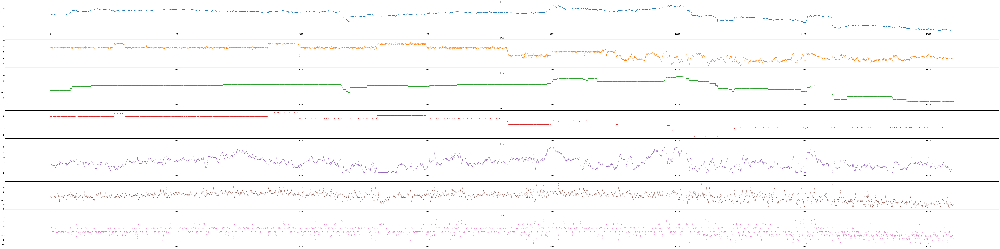

In [7]:
plt.figure(figsize=(80, 20))

for i, col in enumerate(data.columns, start=1):
    plt.subplot(7, 1, i)
    plt.scatter(data_c.index, data_c[col], marker='.', color='C{}'.format(i-1),s=2)
    plt.title(col)

plt.tight_layout()

plt.show()

In [8]:
data_c.corr()

,IN1,IN2,IN3,IN4,IN5,Out1,Out2
IN1,1.000000,0.508753,0.922762,0.450860,0.451824,0.676426,0.439461
IN2,0.508753,1.000000,0.329712,0.899190,0.076832,0.411586,0.251953
IN3,0.922762,0.329712,1.000000,0.207395,0.362761,0.630088,0.458906
IN4,0.450860,0.899190,0.207395,1.000000,0.027312,0.335210,0.240758
IN5,0.451824,0.076832,0.362761,0.027312,1.000000,0.447183,0.144558
Out1,0.676426,0.411586,0.630088,0.335210,0.447183,1.000000,-0.006573
Out2,0.439461,0.251953,0.458906,0.240758,0.144558,-0.006573,1.000000


### Error Details

In [9]:
def results(Y_test,Y_pred,M):
  from sklearn.metrics import mean_squared_error,r2_score

  SSE= mean_squared_error(Y_test,Y_pred)
  MSE= np.mean((Y_test - Y_pred) **2)
  n=len(Y_test)

  AIC = M*2         +n*(np.log(SSE/n))
  BIC = M*np.log(n) +n*(np.log(SSE/n))

#Errors
  print('R2  : ', r2_score(Y_test,Y_pred))
  print('SSE : ', SSE )
  print('MSE : ', MSE )
  print('aic : ', AIC)
  print('bic : ', BIC)


#To Plot
  plt.figure(figsize=(200,4))
  plt.plot(range(len(Y_test)), Y_test, color='blue', label='Actual Y1')
  plt.plot(range(len(Y_test)), Y_pred, color='red', label='Predicted Y1')
  plt.xlabel('Sample Index')
  plt.ylabel('Y1 Value')
  plt.title('Y1 Actual vs Predicted')
  plt.legend()
  plt.show()

#Multivariate Linear Regression

###Loading Data

In [10]:
x  = data_c.loc[:,['IN1','IN2','IN5']]
y1 = data_c.loc[:,'Out1']

###Splitting Dataset

In [11]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = scaler.fit_transform(x)

In [12]:
from sklearn.model_selection import train_test_split
x_train, x_test, y1_train, y1_test = train_test_split(x, y1,test_size=0.2, random_state=42)

### Applying Regression

In [13]:
from sklearn.linear_model import LinearRegression
regressor_y1 = LinearRegression()
regressor_y1.fit(x_train, y1_train)

LinearRegression()

In [14]:
y1_test_values = y1_test.values
y1_pred = regressor_y1.predict(x_test)
print(np.concatenate((y1_pred.reshape(len(y1_pred),1), y1_test_values.reshape(len(y1_test_values),1)),1))

[[ 0.11567933  0.45228992]
 [ 0.18819728 -0.12268636]
 [-0.83381018 -0.8893214 ]
 ...
 [ 0.33487231  0.0689724 ]
 [ 0.06346341  1.31475434]
 [-0.26497554 -0.4101745 ]]


### Plotting Result

R2  :  0.4923305990178001
SSE :  0.42316973506168204
MSE :  0.42316973506168204
aic :  -24655.99218906102
bic :  -24638.176852407527


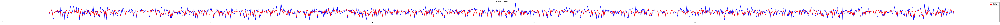

In [15]:
results(y1_test,y1_pred,3)

# Polynomial

###Loading Data

In [16]:
x  = data_c.loc[:,['IN1','IN2','IN5','IN3','IN4']]
y1 = data_c.loc[:,'Out1']

###Splitting Dataset

In [17]:
from sklearn.model_selection import train_test_split
x_train, x_test, y1_train, y1_test = train_test_split(x, y1,test_size=0.2, random_state=42)

###Applying Regression

In [18]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

poly_reg = PolynomialFeatures(degree = 7)
x_poly = poly_reg.fit_transform(x_train)

regressor = LinearRegression()
regressor.fit(x_poly, y1_train)

LinearRegression()

In [19]:
y1_test_values = y1_test.values
y1_pred = regressor.predict(poly_reg.transform(x_test))
np.set_printoptions(precision=2)
print(np.concatenate((y1_pred.reshape(len(y1_pred),1), y1_test_values.reshape(len(y1_test),1)),1))

[[ 0.13  0.45]
 [-0.3  -0.12]
 [-0.49 -0.89]
 ...
 [ 0.04  0.07]
 [ 0.49  1.31]
 [-0.55 -0.41]]


### Plotting Results

R2  :  0.6612883006797894
SSE :  0.2823344085468157
MSE :  0.2823344085468157
aic :  -25790.313450250018
bic :  -25772.498113596524


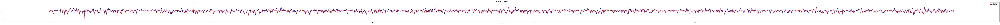

In [20]:
results(y1_test,y1_pred,3)

# Lasso regression

In [21]:
X  = data_c.loc[:,['IN1','IN2','IN5']]
y1 = data_c.loc[:,'Out1']

In [22]:
from sklearn.model_selection import train_test_split
X_train, X_test, y1_train, y1_test = train_test_split(X,y1, test_size = 0.3, random_state = 0)

In [23]:
from sklearn.linear_model import LassoCV

# Define a range of alpha values to test
alphas = np.logspace(-4, 4, 100)

# Initialize the LassoCV model
lasso_cv = LassoCV(alphas=alphas, cv=5)  # cv is the number of folds for cross-validation

# Fit the model
lasso_cv.fit(X_train, y1_train)

# Optimal alpha
optimal_alpha = lasso_cv.alpha_
print("Optimal alpha:",optimal_alpha)

Optimal alpha: 0.00012045035402587823


In [24]:
from sklearn.linear_model import Lasso
lasso_model = Lasso(alpha= optimal_alpha)
lasso_model.fit(X_train, y1_train)

y1_test_values = y1_test.values
y1_pred = lasso_model.predict(X_test)
print(np.concatenate((y1_pred.reshape(len(y1_pred),1), y1_test_values.reshape(len(y1_test),1)),1))

[[ 0.2   0.36]
 [-1.14 -0.6 ]
 [ 0.59  0.26]
 ...
 [ 0.52  0.16]
 [ 0.64  0.64]
 [ 0.41  1.7 ]]


R2  :  0.4978087350928774
SSE :  0.4373587690707025
MSE :  0.4373587690707025
aic :  -38558.185402347066
bic :  -38539.153313629846


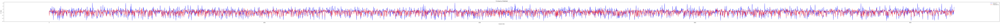

In [25]:
results(y1_test,y1_pred,3)

#PCR

In [38]:
from sklearn.decomposition import PCA

X  = data_c.loc[:,['IN1','IN2','IN3','IN4','IN5']]
y = data_c.loc[:,'Out1']

X_train, X_test, y1_train, y1_test = train_test_split(X, y, test_size=0.3, random_state=42)

pca = PCA(n_components=3)
x_train = pca.fit_transform(X_train)
x_test = pca.transform(X_test)

explained_variance = pca.explained_variance_ratio_

print("Explained Variance Ratio:")
sum=0
for i, ratio in enumerate(explained_variance):
    print(f"  Component {i+1}: {ratio:.4f}")
    sum+= ratio
print("Data Contained = ",sum*100,"%")

Explained Variance Ratio:
  Component 1: 0.5635
  Component 2: 0.2790
  Component 3: 0.1302
Data Contained =  97.27078409571048 %


###Applying Regression

In [31]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

poly_reg = PolynomialFeatures(degree = 7)
x_poly = poly_reg.fit_transform(x_train)

regressor = LinearRegression()
regressor.fit(x_poly, y1_train)

LinearRegression()

In [32]:
y1_test_values = y1_test.values
y1_pred = regressor.predict(poly_reg.transform(x_test))
np.set_printoptions(precision=2)
print(np.concatenate((y1_pred.reshape(len(y1_pred),1), y1_test_values.reshape(len(y1_test),1)),1))

[[ 0.05  0.45]
 [ 0.06 -0.12]
 [-0.98 -0.89]
 ...
 [-1.58 -0.99]
 [ 0.51 -0.22]
 [-1.9  -2.23]]


### Plotting Results

R2  :  0.5747908869876575
SSE :  0.35500352259287343
MSE :  0.35500352259287343
aic :  -39427.45827019376
bic :  -39383.050063186914


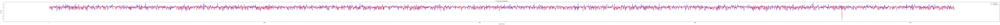

In [39]:
results(y1_test,y1_pred,7)

#LSTM Trials (Yet to read)


Epoch 1/80
Epoch 2/80
Epoch 3/80
Epoch 4/80
Epoch 5/80
Epoch 6/80
Epoch 7/80
Epoch 8/80
Epoch 9/80
Epoch 10/80
Epoch 11/80
Epoch 12/80
Epoch 13/80
Epoch 14/80
Epoch 15/80
Epoch 16/80
Epoch 17/80
Epoch 18/80
Epoch 19/80
Epoch 20/80
Epoch 21/80
Epoch 22/80
Epoch 23/80
Epoch 24/80
Epoch 25/80
Epoch 26/80
Epoch 27/80
Epoch 28/80
Epoch 29/80
Epoch 30/80
Epoch 31/80
Epoch 32/80
Epoch 33/80
Epoch 34/80
Epoch 35/80
Epoch 36/80
Epoch 37/80
Epoch 38/80
Epoch 39/80
Epoch 40/80
Epoch 41/80
Epoch 42/80
Epoch 43/80
Epoch 44/80
Epoch 45/80
Epoch 46/80
Epoch 47/80
Epoch 48/80
Epoch 49/80
Epoch 50/80
Epoch 51/80
Epoch 52/80
Epoch 53/80
Epoch 54/80
Epoch 55/80
Epoch 56/80
Epoch 57/80
Epoch 58/80
Epoch 59/80
Epoch 60/80
Epoch 61/80
Epoch 62/80
Epoch 63/80
Epoch 64/80
Epoch 65/80
Epoch 66/80
Epoch 67/80
Epoch 68/80
Epoch 69/80
Epoch 70/80
Epoch 71/80
Epoch 72/80
Epoch 73/80
Epoch 74/80
Epoch 75/80
Epoch 76/80
Epoch 77/80
Epoch 78/80
Epoch 79/80
Epoch 80/80
91/91 - 0s - loss: 0.0252 - 391ms/epoch - 4ms/ste

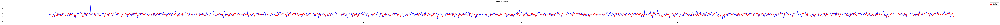

In [40]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data[['IN1', 'IN2', 'IN5', 'Out1']])


X = scaled_data[:, :-1]
Y = scaled_data[:, -1]

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)


X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))


model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(1, 3)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mae')


model.fit(X_train, Y_train, epochs=80, batch_size=64, verbose=5)


loss = model.evaluate(X_test, Y_test, verbose=2)
print(f'Test loss: {loss}')

Y_pred = model.predict(X_test)
results(Y_test,Y_pred,3)

In [ ]:
results(Y_test,Y_pred,3)

In [ ]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Dense, Input
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Data preprocessing
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data[['IN1', 'IN2', 'IN5', 'Out1']])
X = scaled_data[:, :-1]
Y = scaled_data[:, -1]
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Reshape data for LSTM
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Define and train the autoencoder
input_shape = (1, X_train.shape[2])  # Input shape for autoencoder
input_layer = Input(shape=input_shape)
encoded = Dense(32, activation='relu')(input_layer)
decoded = Dense(X_train.shape[2], activation='sigmoid')(encoded)
autoencoder = Model(input_layer, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
autoencoder.fit(X_train, X_train, epochs=10, batch_size=64, shuffle=True, validation_data=(X_test, X_test))


# Denoise the data using the trained autoencoder
X_train_denoised = autoencoder.predict(X_train)
X_test_denoised = autoencoder.predict(X_test)

# Train the LSTM model using the denoised data
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(1, 3)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mae')
model.fit(X_train_denoised, Y_train, epochs=80, batch_size=64, verbose=1)
loss = model.evaluate(X_test_denoised, Y_test, verbose=2)
print(f'Test loss: {loss}')
Y_pred = model.predict(X_test_denoised)
results(Y_test,Y_pred,3)

R2  :  0.49018301778116036
SSE :  0.0013573154082685127
MSE :  0.004030782843068942
aic :  -41964.809120658436
bic :  -41946.91144245318


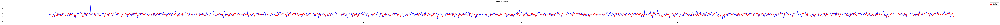

In [41]:
results(Y_test,Y_pred,3)

## KNN

R2  :  0.7050901665026967
SSE :  0.24582319885084877
MSE :  0.24582319885084877
aic :  -26178.47188286952
bic :  -26160.656546216025


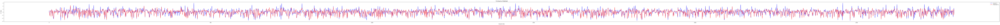

In [44]:

import pandas as pd
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


X = data_c.loc[:,['IN1','IN2','IN5','IN3','IN4']]
y = data_c.loc[:,'Out1']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

results(y_test,y_pred,3)

R2  :  0.6438271009510739
SSE :  0.2968892571328519
MSE :  0.2968892571328519
aic :  -25649.41509585458
bic :  -25631.599759201086


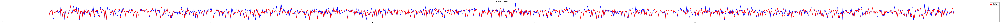

In [45]:
import pandas as pd
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, r2_score


X = data_c.loc[:, ['IN1', 'IN2', 'IN5', 'IN3', 'IN4']]
y = data_c.loc[:, 'Out1']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the featuresZhbx
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Apply PCA
pca = PCA(n_components=3)  # You can adjust the number of principal components
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Create the KNN regression model
knn = KNeighborsRegressor(n_neighbors=5)  # You can adjust the value of n_neighbors

# Train the model
knn.fit(X_train_pca, y_train)

# Make predictions on the test set
y_pred = knn.predict(X_test_pca)


results(y_test,y_pred,3)

In [ ]:
import pandas as pd
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import Pipeline


X = data_c.loc[:, ['IN1', 'IN2', 'IN5', 'IN3', 'IN4']]
y = data_c.loc[:, 'Out1']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline with polynomial features, scaling, and KNN regression
polynomial_degree = 3  # You can adjust the degree of the polynomial

polynomial_regression = Pipeline([
    ('poly', PolynomialFeatures(degree=polynomial_degree)),
    ('scaler', StandardScaler()),
    ('knn', KNeighborsRegressor(n_neighbors=5))
])

# Train the pipeline
polynomial_regression.fit(X_train, y_train)

# Make predictions on the test set
y_pred = polynomial_regression.predict(X_test)


results(y_test,y_pred,3)